# Demonstrating some `ap_pipe-notebooks` plotting utilities

* Most of these plotting functions were implented in DM-20556.

* Some bugfixes and this updated demo notebook were done in DM-24348.

The plots shown here allow `ap_pipe` users to quickly visualize the science dataset as well as the DIA Sources and DIA Objects that land in the Alert Production Database (APDB).

### Start with the usual imports

In [1]:
%matplotlib notebook
#%matplotlib ipympl
import os
import sys
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import importlib

import lsst.daf.persistence as dafPersist
import lsst.geom
import lsst.pipe.base as pipeBase
import lsst.afw.display as afwDisplay

### Import the `ap_pipe-notebooks` plotting tools

In [2]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import plotLightcurve as plc
import apdbPlots as pla

In [3]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(plc)
importlib.reload(pla)

<module 'apdbPlots' from '/project/mrawls/ap_pipe-notebooks/apdbPlots.py'>

## Let the plotting demo begin - DECam first

### Load the DIA Object and Source tables from the APDB
The `loadTables` function also returns flag-filtered `goodObj` and `goodSrc`. These only include sources which have none of `bad`, `suspect`, or `saturatedCenter` flags set. You could select different flags to exclude by passing a different list of full flag names (e.g., `base_PixelFlags_flag_bad`) to `loadTables`.

In [4]:
repo_decam = '/project/mrawls/hits2015/rerun/cw_2020_02'
objTableDecam, srcTableDecam, goodObjDecam, goodSrcDecam = pla.loadTables(repo_decam)  # default is decam

/opt/lsst/software/stack/stack/miniconda3-4.7.12-984c9f7/Linux64/ap_association/19.0.0-14-g7adedf7+13/python/lsst/ap/association/mapApData.py:388: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  table_list = list(yaml.load_all(yaml_stream))


<IPython.core.display.Javascript object>


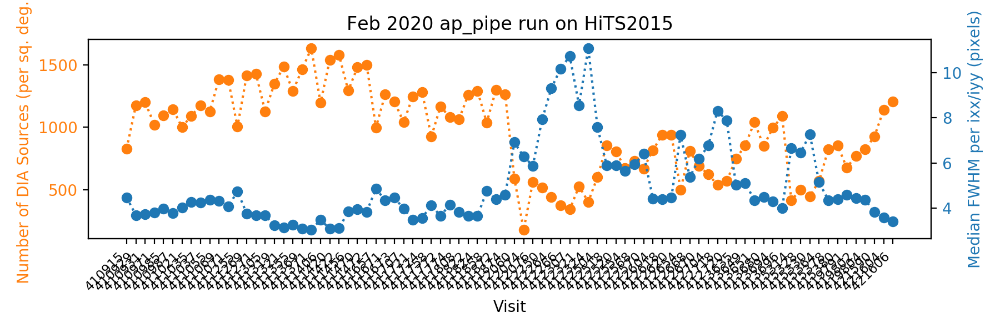

In [5]:
pla.plotDiaSourcesPerVisit(repo_decam, goodSrcDecam, title='Feb 2020 ap_pipe run on HiTS2015')

<IPython.core.display.Javascript object>


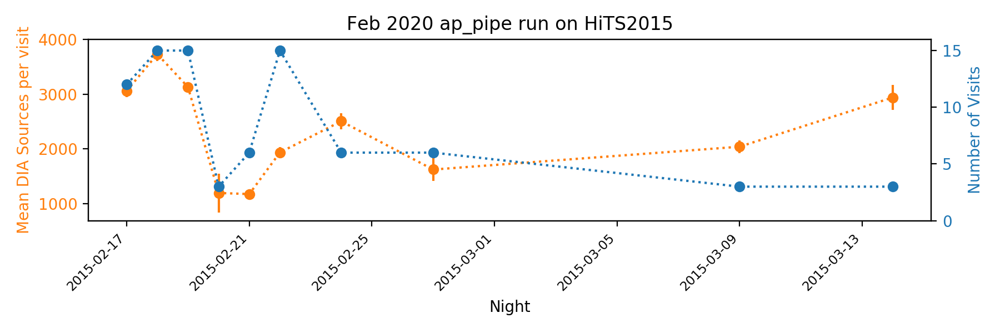

In [6]:
pla.plotDiaSourcesPerNight(goodSrcDecam, title='Feb 2020 ap_pipe run on HiTS2015')

<IPython.core.display.Javascript object>


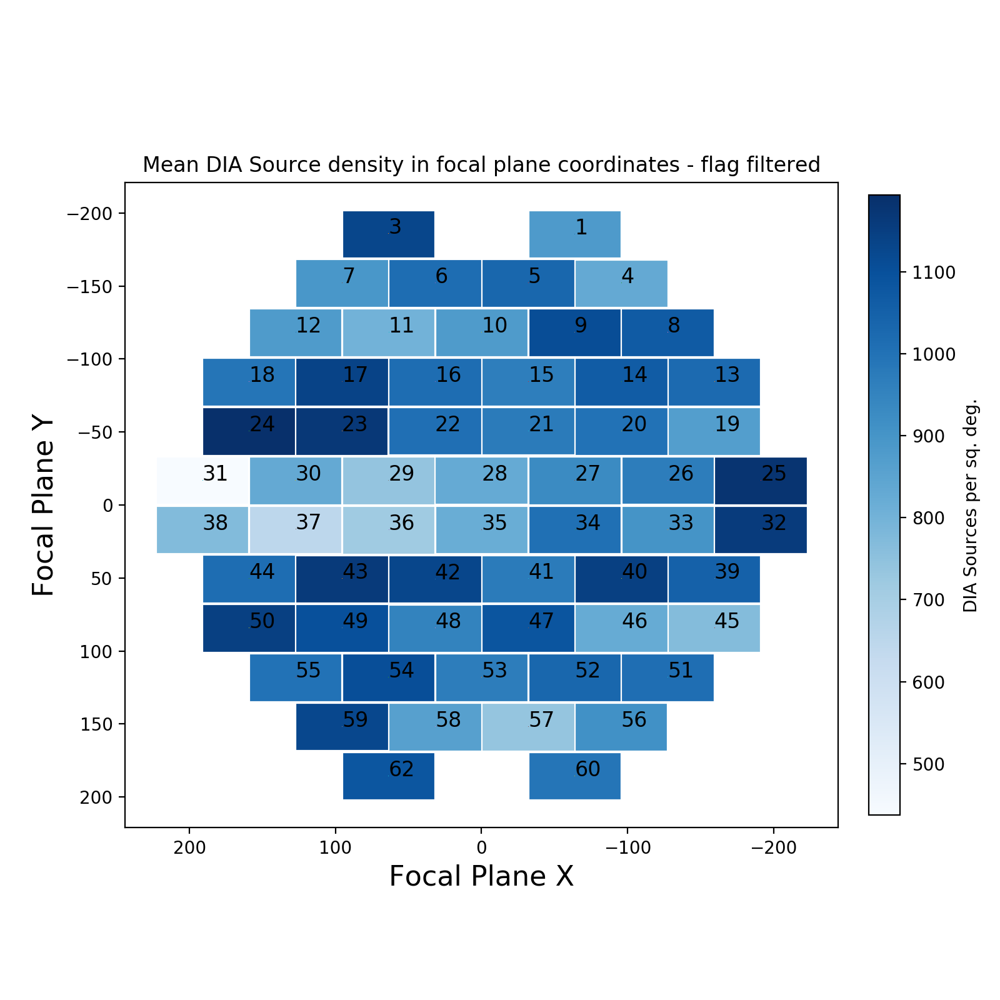

In [7]:
pla.plotDiaSourceDensityInFocalPlane(repo_decam, goodSrcDecam, title='- flag filtered')

<IPython.core.display.Javascript object>


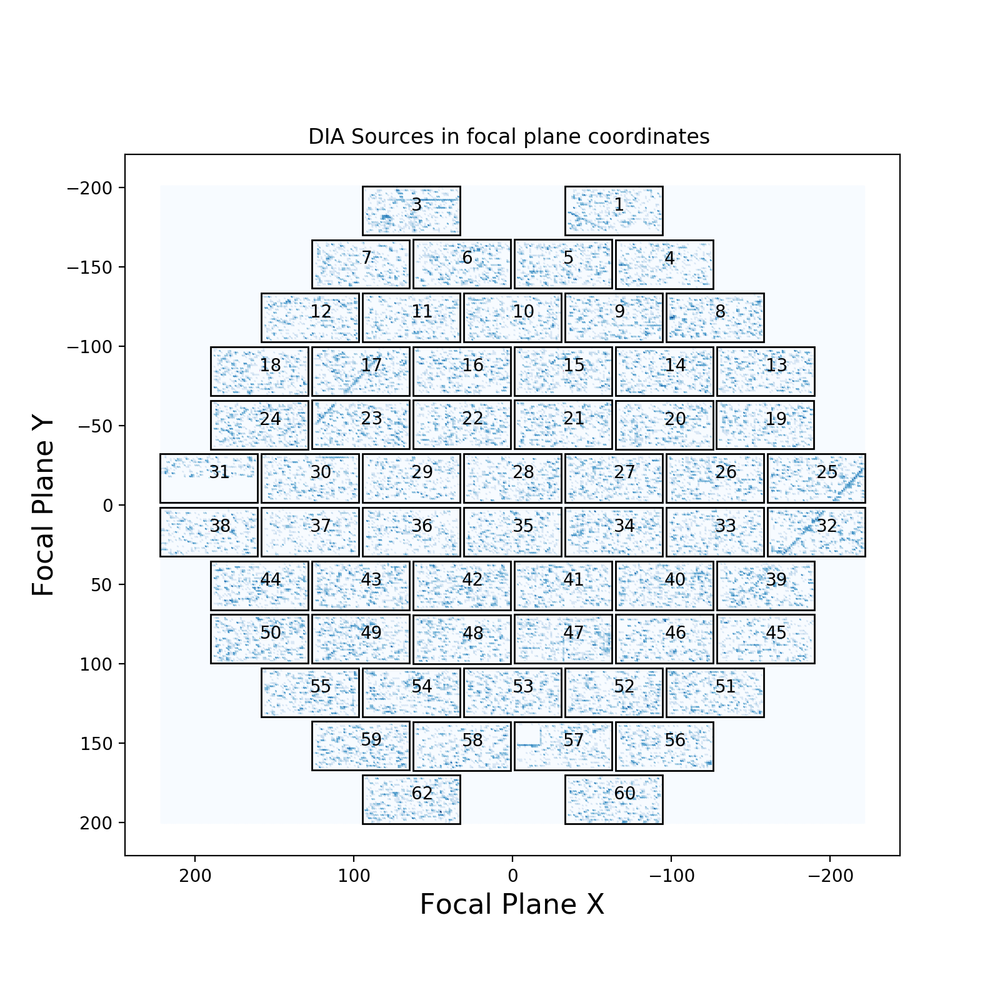

In [8]:
pla.plotDiaSourcesInFocalPlane(repo_decam, goodSrcDecam)

<IPython.core.display.Javascript object>


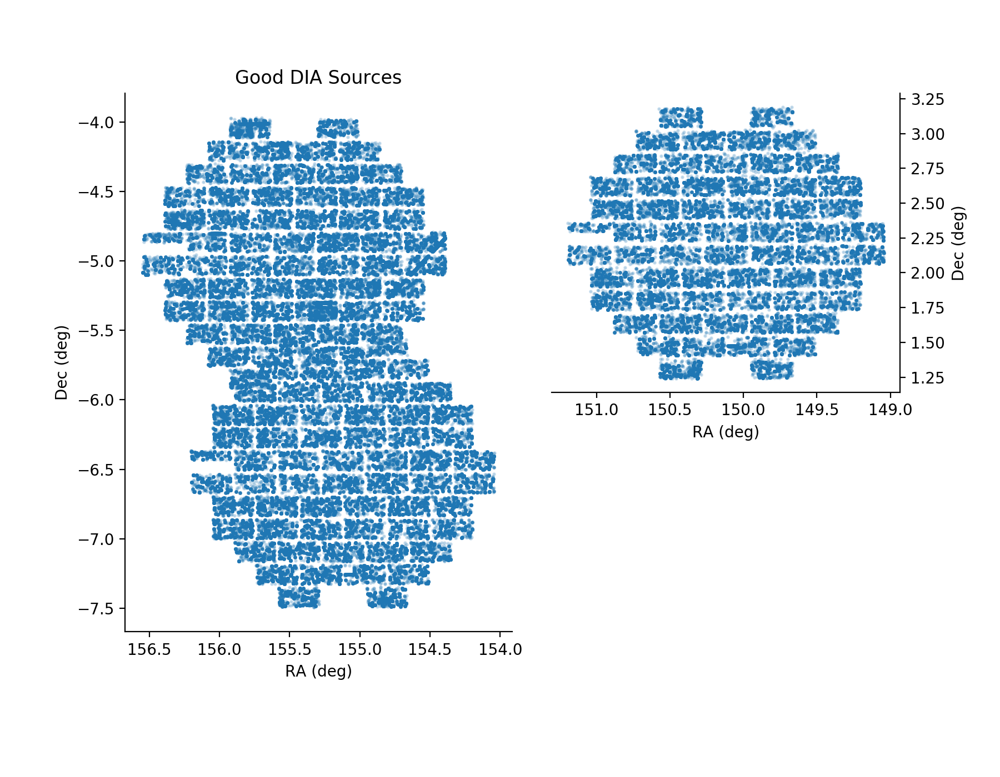

In [27]:
hitsPlot = pla.plotHitsSourcesOnSky(goodSrcDecam, title='Good DIA Sources')

### Print a few DIA Object IDs to find one with lots of constituent DIA Sources

In [10]:
objTableDecam.loc[objTableDecam['nDiaSources'] > 20][0:10]

,diaObjectId,ra,decl,nDiaSources,gPSFluxMean,validityEnd,flags
102488,176492691662569740,155.733252,-5.807899,21,-524.588439,None,1
118879,176486859096981913,150.596321,1.802047,21,639.309687,None,1
124576,176539274877862097,155.427656,-5.562897,21,489.088559,None,1
125881,176486889161752898,149.541214,1.501249,21,1467.620672,None,1
128024,176486700183191859,150.784250,2.810431,22,-3353.177175,None,1
129731,176486704478159287,149.478015,2.642421,21,-2642.472626,None,1
130871,176486859096981986,150.680761,1.733181,21,145.747496,None,1
131834,176516971112694121,154.953152,-7.355480,21,-4036.629711,None,1
134204,176492683072635110,155.020121,-5.835198,25,-701.559584,None,1
135135,176492704547471581,155.256097,-5.869210,22,1305.420648,None,1


Template dataId {'tract': 0, 'patch': '12,10', 'filter': 'g'}


<IPython.core.display.Javascript object>


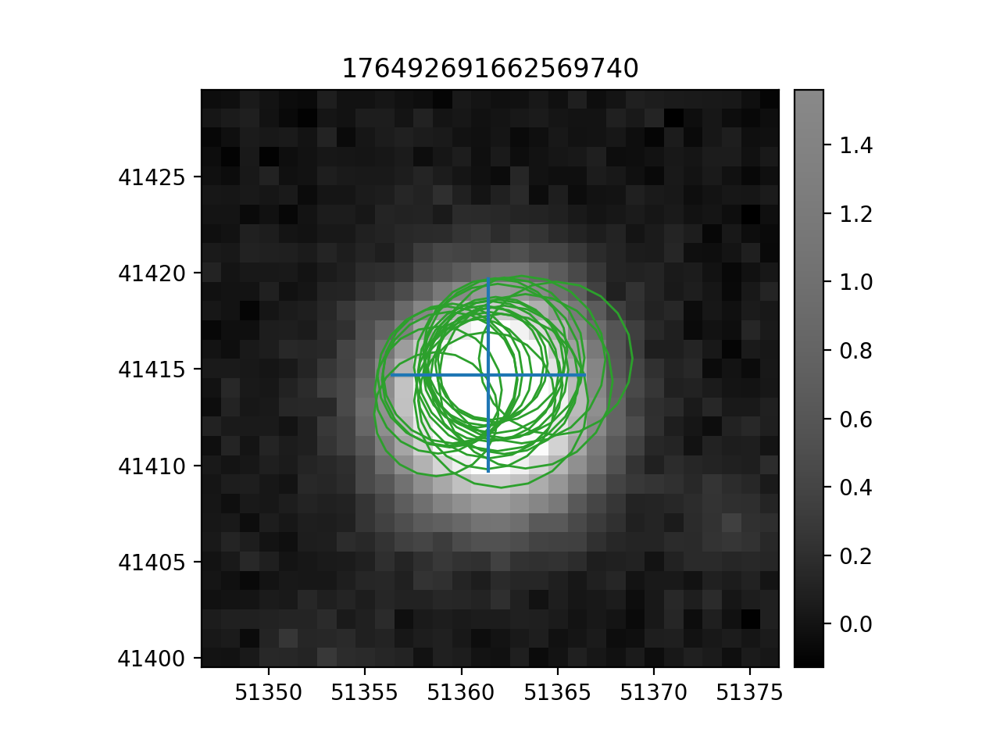

In [11]:
pla.plotSourceLocationsOnObject(176492691662569740, objTableDecam, srcTableDecam, repo_decam, goodSrc=goodSrcDecam, plotIdx=5)

<IPython.core.display.Javascript object>


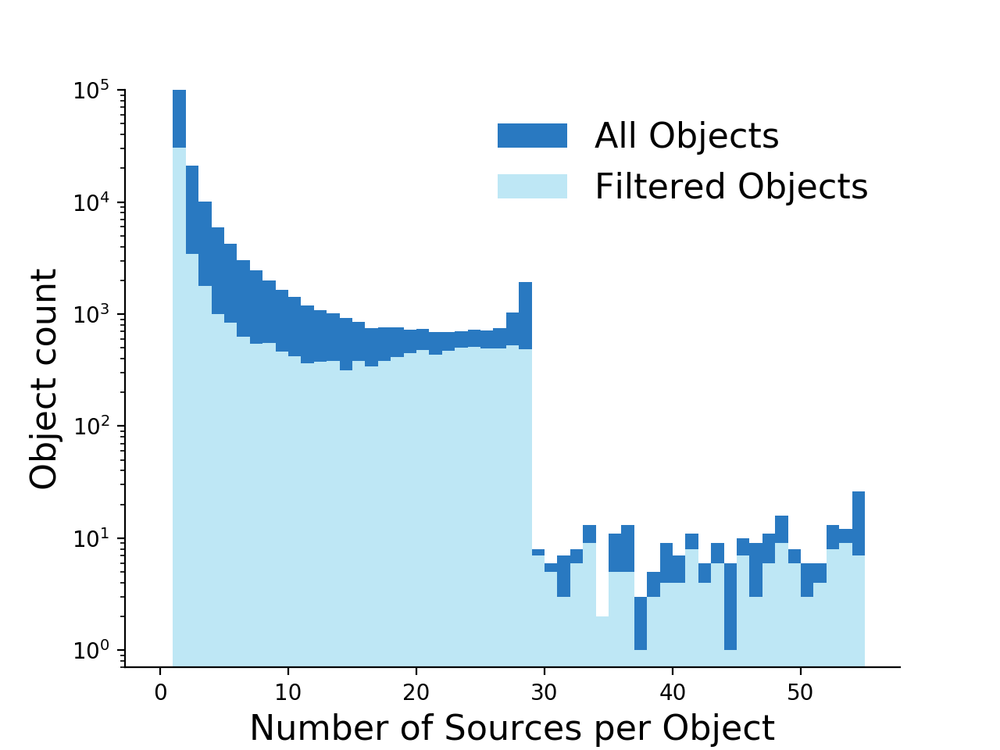

In [12]:
hist = doa.plotDiaObjectHistogram(objTableDecam, goodObjDecam)

<IPython.core.display.Javascript object>


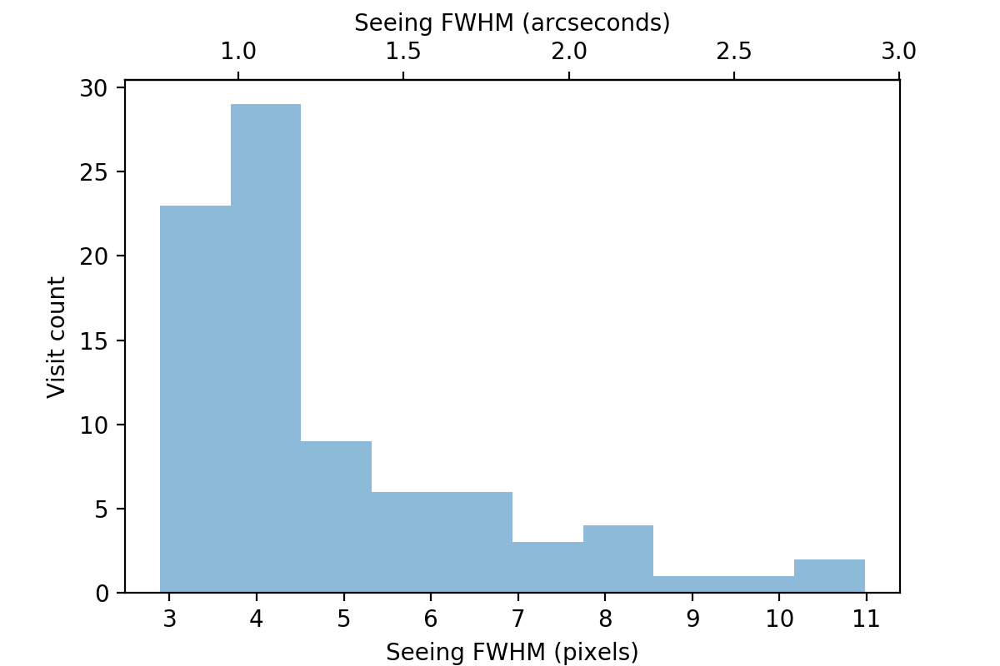

In [13]:
pla.plotSeeingHistogram(repo_decam, srcTableDecam)

<IPython.core.display.Javascript object>


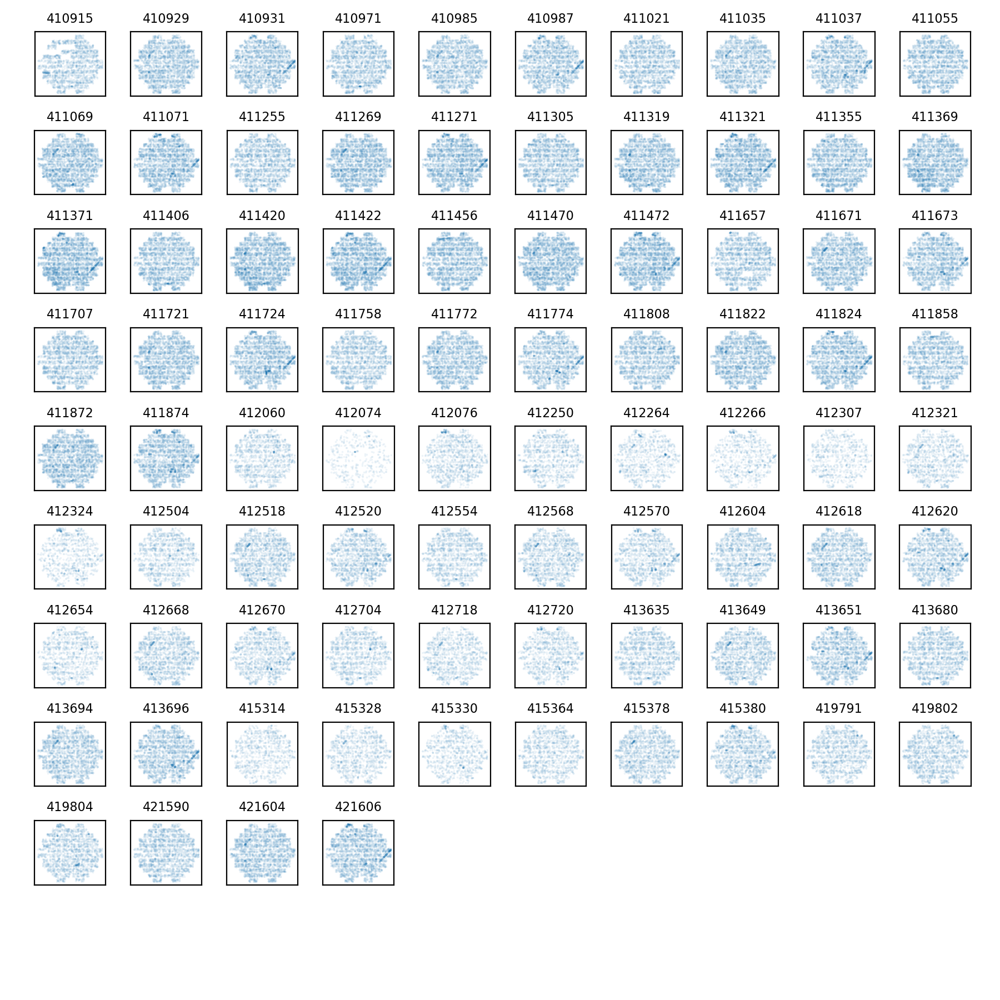

In [14]:
pla.plotDiaSourcesOnSkyGrid(repo_decam, goodSrcDecam)

## Create the same set of plots for HSC

In [15]:
lsst.obs.base.FilterDefinitionCollection.reset()  # workaround for loading a new camera

In [16]:
repo_hsc = '/project/mrawls/cosmos/rerun/ap_pipe-g-1'
objTableHsc, srcTableHsc, goodObjHsc, goodSrcHsc = pla.loadTables(repo_hsc, cam='hsc')

/opt/lsst/software/stack/stack/miniconda3-4.7.12-984c9f7/Linux64/ap_association/19.0.0-14-g7adedf7+13/python/lsst/ap/association/mapApData.py:388: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  table_list = list(yaml.load_all(yaml_stream))


<IPython.core.display.Javascript object>


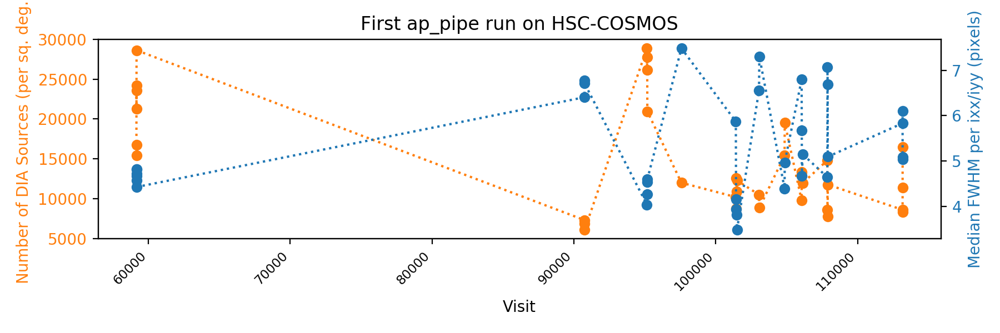

In [17]:
pla.plotDiaSourcesPerVisit(repo_hsc, goodSrcHsc, title='First ap_pipe run on HSC-COSMOS')

<IPython.core.display.Javascript object>


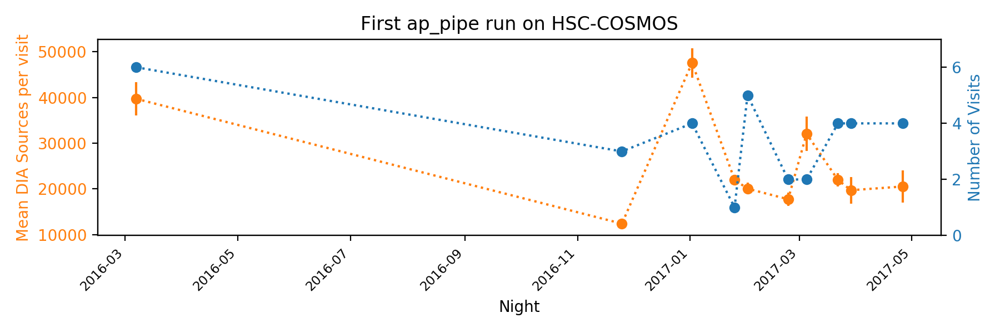

In [18]:
pla.plotDiaSourcesPerNight(goodSrcHsc, title='First ap_pipe run on HSC-COSMOS')

<IPython.core.display.Javascript object>


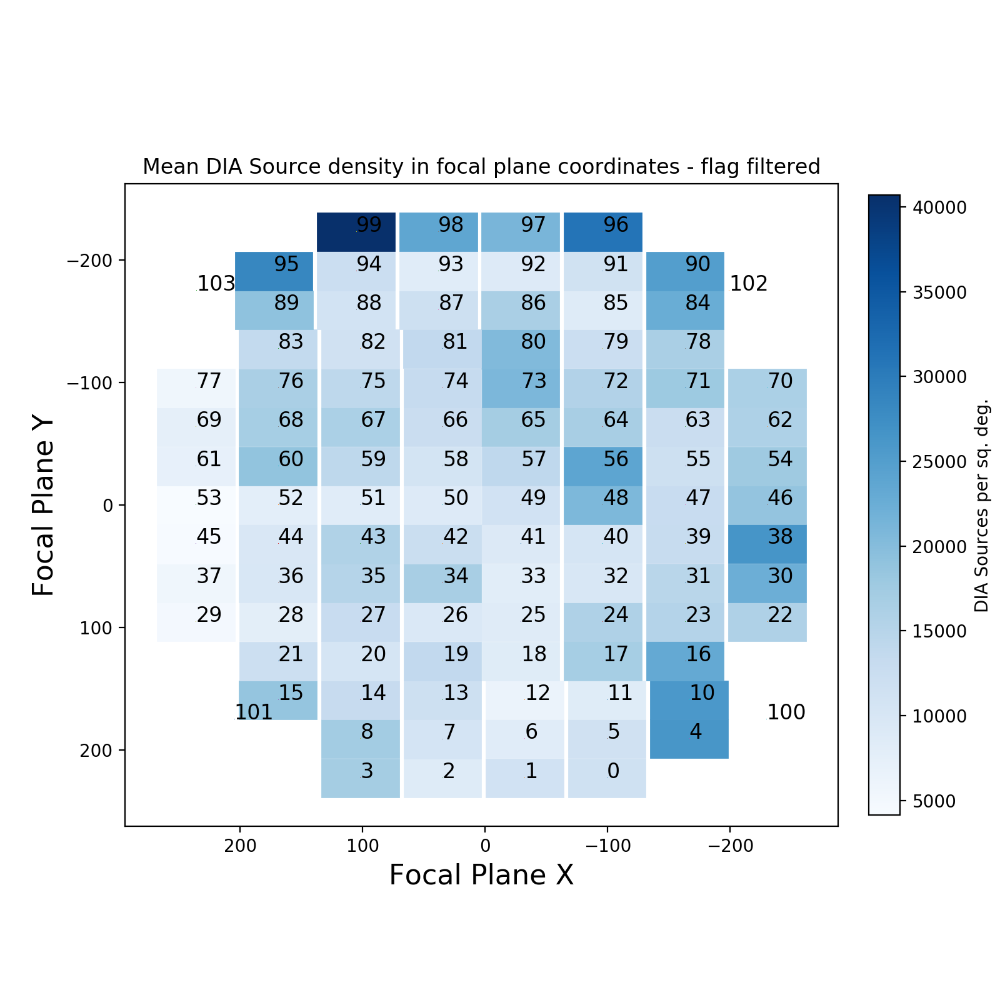

In [19]:
pla.plotDiaSourceDensityInFocalPlane(repo_hsc, goodSrcHsc, title='- flag filtered')

<IPython.core.display.Javascript object>


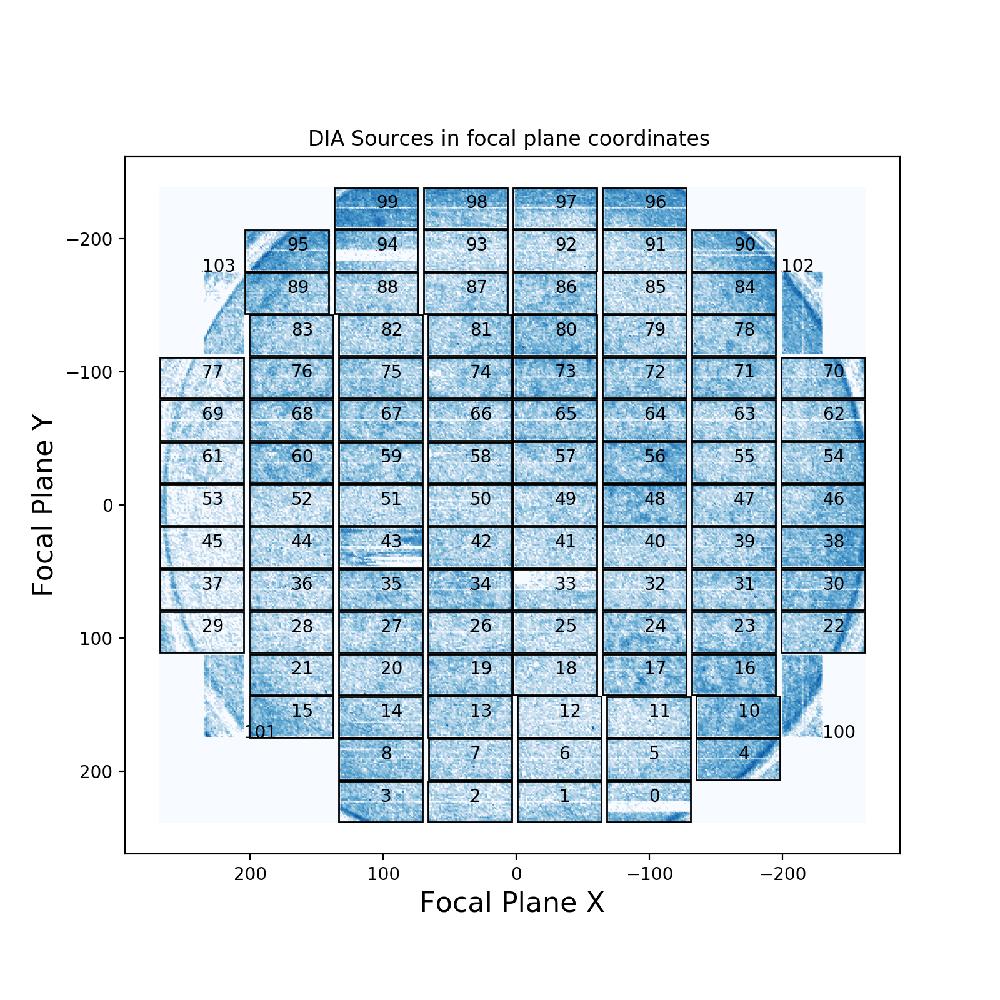

In [20]:
pla.plotDiaSourcesInFocalPlane(repo_hsc, goodSrcHsc)

<IPython.core.display.Javascript object>


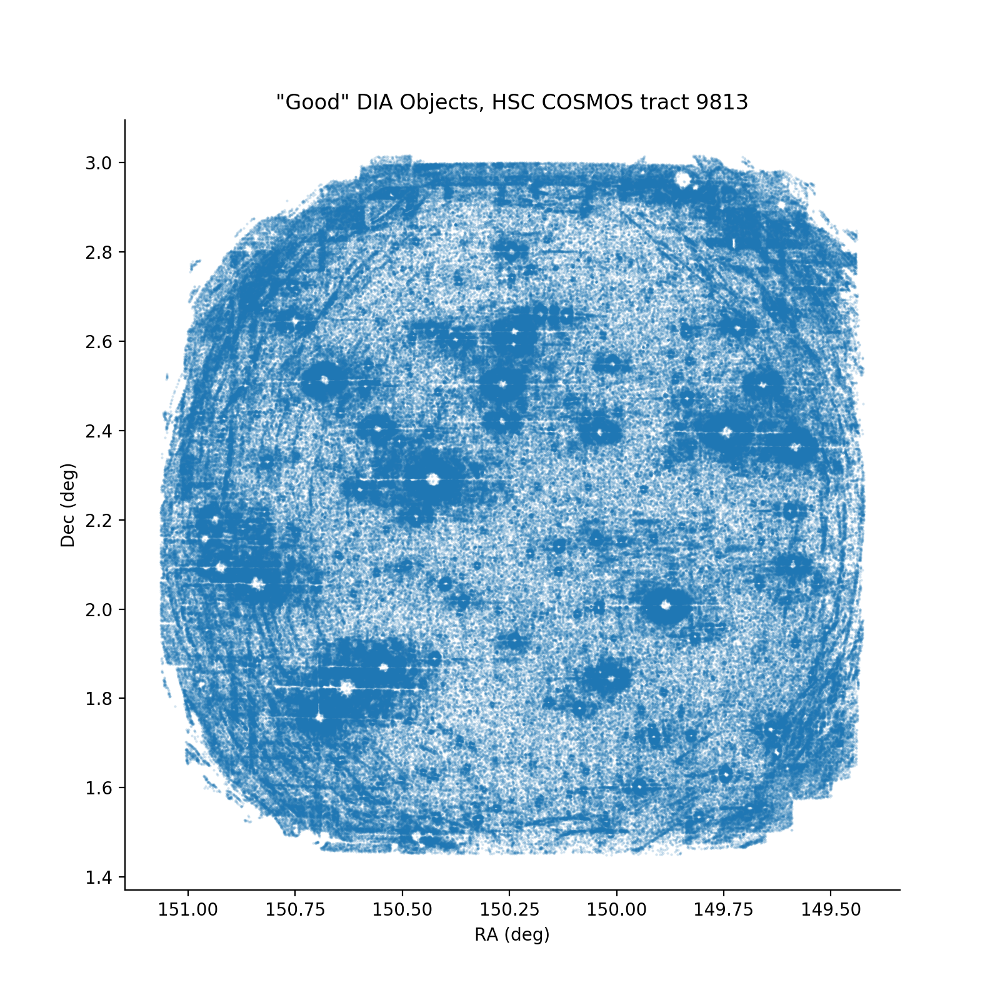

Text(0.5, 1.0, '"Good" DIA Objects, HSC COSMOS tract 9813')

In [21]:
# Approximate HSC equivalent of `plotHitsSourcesOnSky`

fig, ax1 = plt.subplots(figsize=(8, 8))
ax1.scatter(goodObjHsc['ra'], goodObjHsc['decl'], c='C0', s=1, marker='.', alpha=0.2)
ax1.set_xlabel('RA (deg)')
ax1.set_ylabel('Dec (deg)')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.invert_xaxis()
plt.title('"Good" DIA Objects, HSC COSMOS tract 9813')

In [22]:
objTableHsc.loc[objTableHsc['nDiaSources'] > 20][0:10]

,diaObjectId,ra,decl,nDiaSources,gPSFluxMean,validityEnd,flags
740887,50809785234228118,149.631846,2.494207,21,-442.798497,None,1
741302,50811361487225543,149.733806,2.076329,21,828.413705,None,1
741377,50809643500306962,149.787116,2.106672,24,-883.006293,None,1
741798,50809682155012736,149.625229,2.173588,21,27.972822,None,1
741877,50809682155012809,149.665771,2.205075,24,47535.044820,None,1
768360,50809480291549973,150.449753,1.664047,22,36460.457392,None,1
772246,50809613435536191,149.735377,2.056628,24,61577.214059,None,1
772380,50809609140569021,149.826047,2.066130,25,-3480.389428,None,1
776674,50809836773835403,149.782479,2.745080,21,-5768.866107,None,1
776681,50811580530557650,149.779415,2.756497,24,-1034.475643,None,1


Template dataId {'tract': 9813, 'patch': '8,3', 'filter': 'g'}
Failed to retrieve template; image displayed is first processed image


<IPython.core.display.Javascript object>


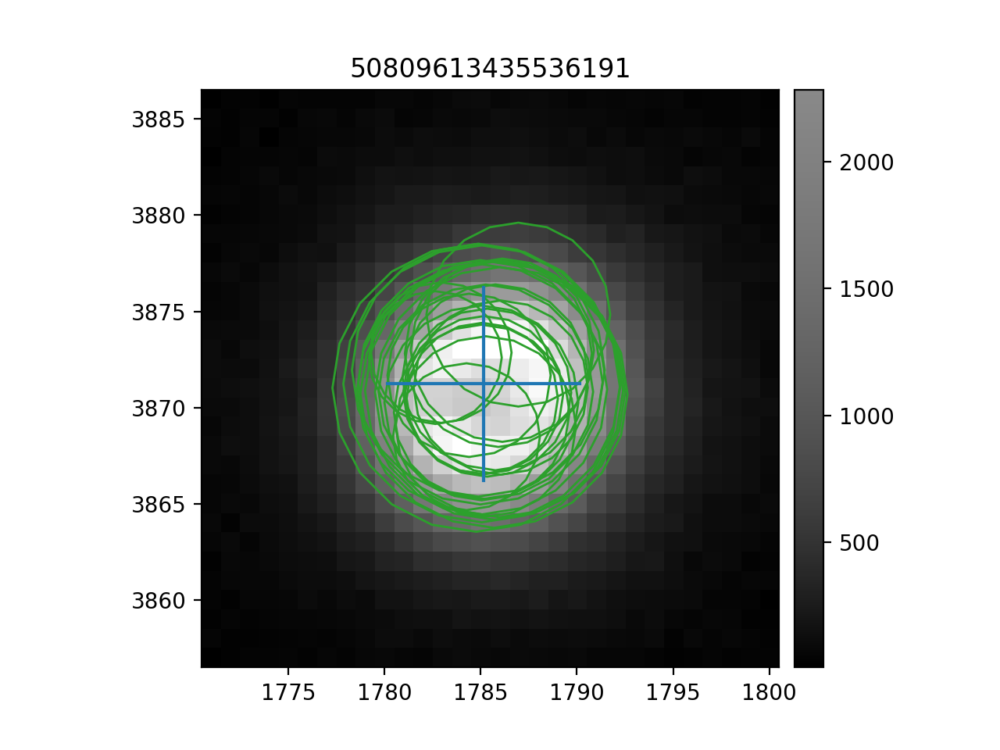

In [23]:
pla.plotSourceLocationsOnObject(50809613435536191, objTableHsc, srcTableHsc, repo_hsc, goodSrc=goodSrcHsc, plotIdx=16)

<IPython.core.display.Javascript object>


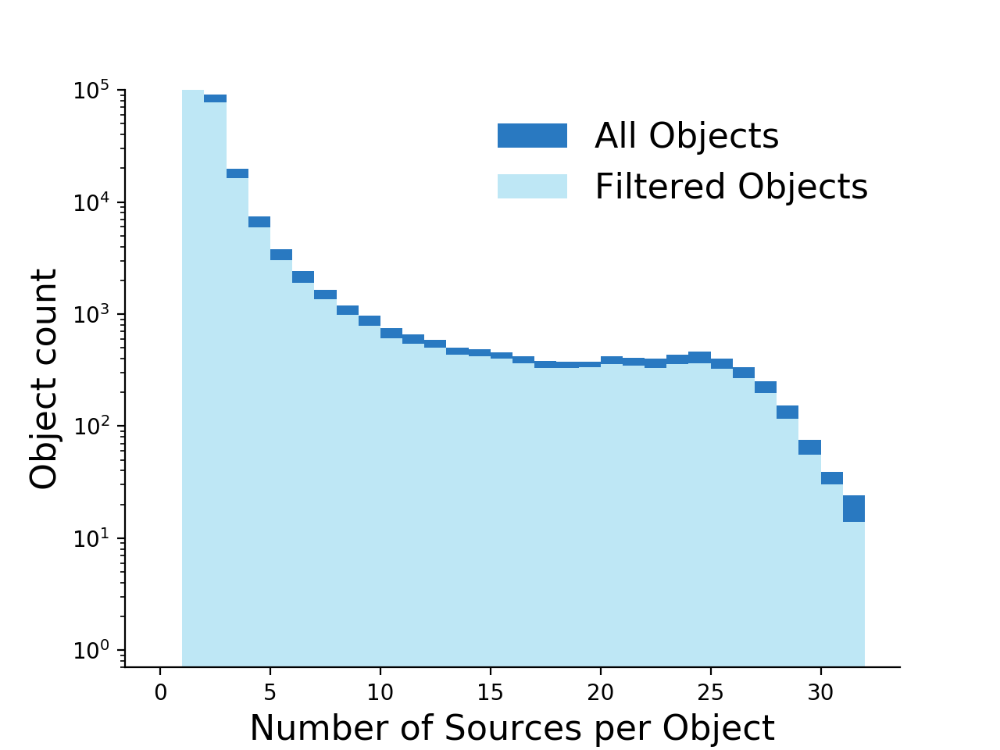

In [24]:
hist = doa.plotDiaObjectHistogram(objTableHsc, goodObjHsc)

<IPython.core.display.Javascript object>


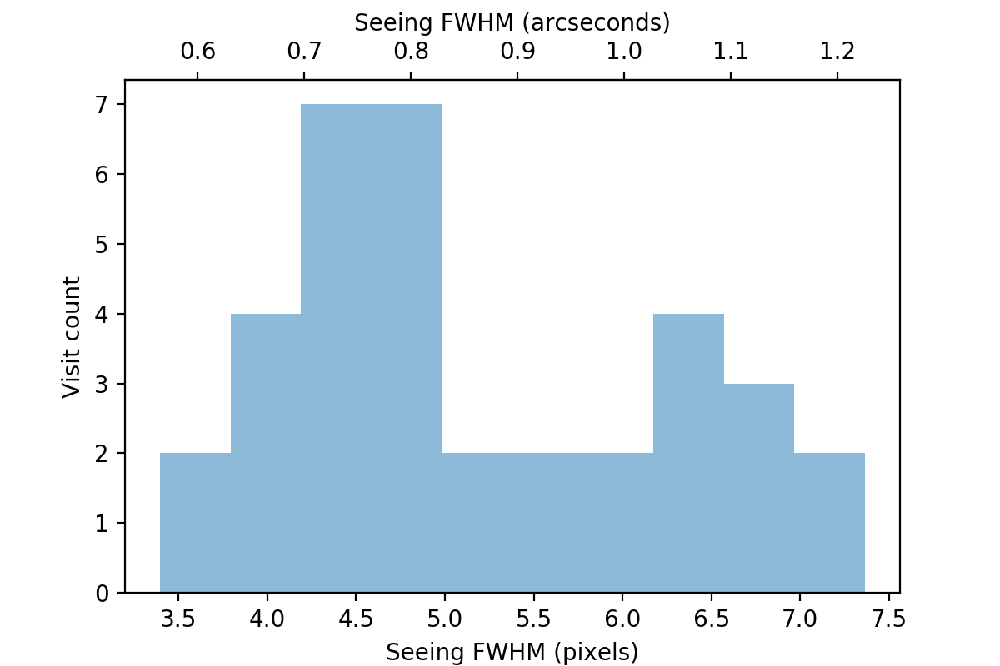

In [25]:
pla.plotSeeingHistogram(repo_hsc, srcTableHsc)

<IPython.core.display.Javascript object>


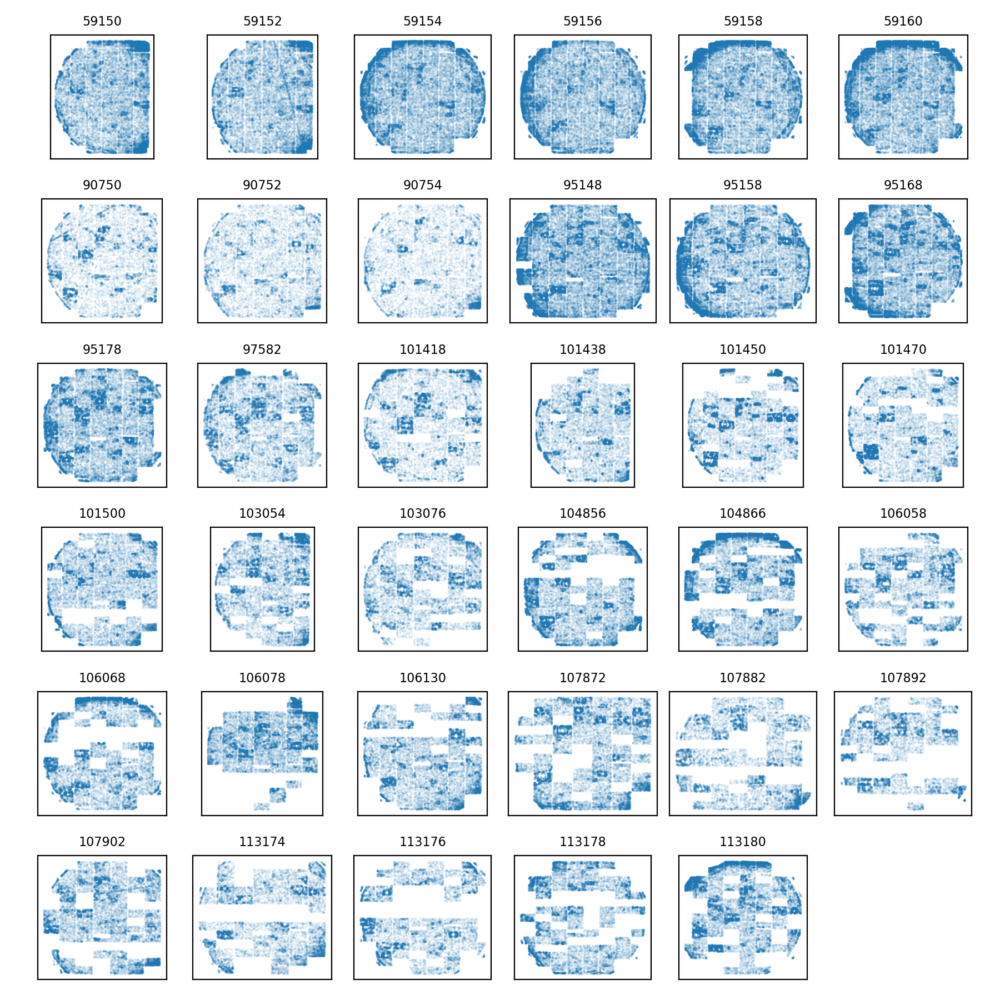

In [26]:
pla.plotDiaSourcesOnSkyGrid(repo_hsc, goodSrcHsc)